# Introduction to NumPy and arrays

*GEOL 3600 / 5700 Introduction to Python Programming for Earth Scientists*

*27 September 2023*

### Goals

- Import numpy
- Create numpy array variables using `array`, `zeros`, `ones`, `arange`, and `linspace`
- Use slicing to index values in an array
- Perform operations on arrays
- Use numpy mathematical functions such as `exp`, `sin`, etc.

### An example application of planetary temperature theory

- Mid-Cretaceous (~105-89 million years ago): warmest time in the last ~140 million years

- Dinosaurs and crocodile-like animals living near the poles

- Sea level 100-250 m higher

- Temperate climates much further poleward


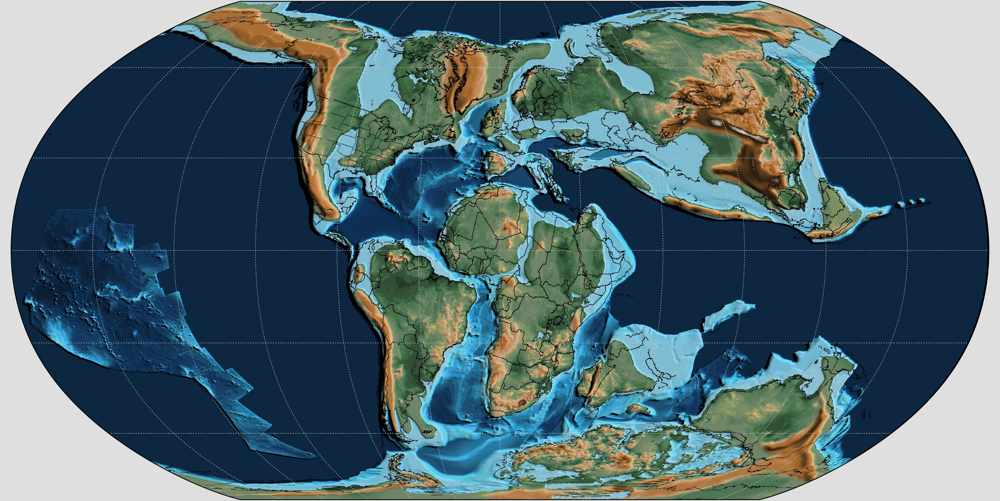





Bice & Norris (2002, Paleoceanography):

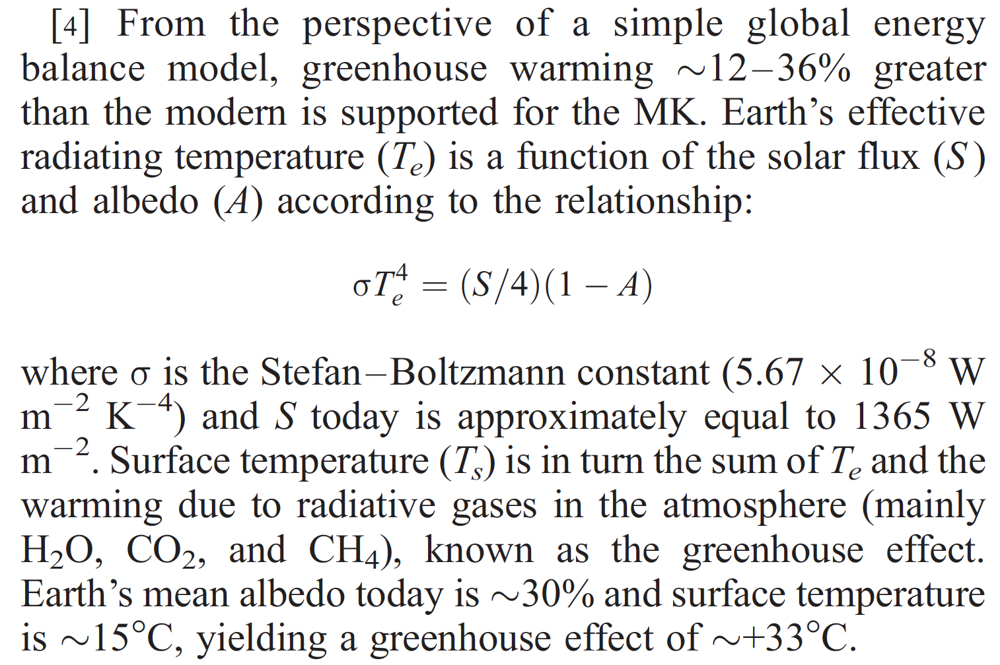

Ladant & Donnadieu (2016): Cretaceous climate and ice-sheet simulations:

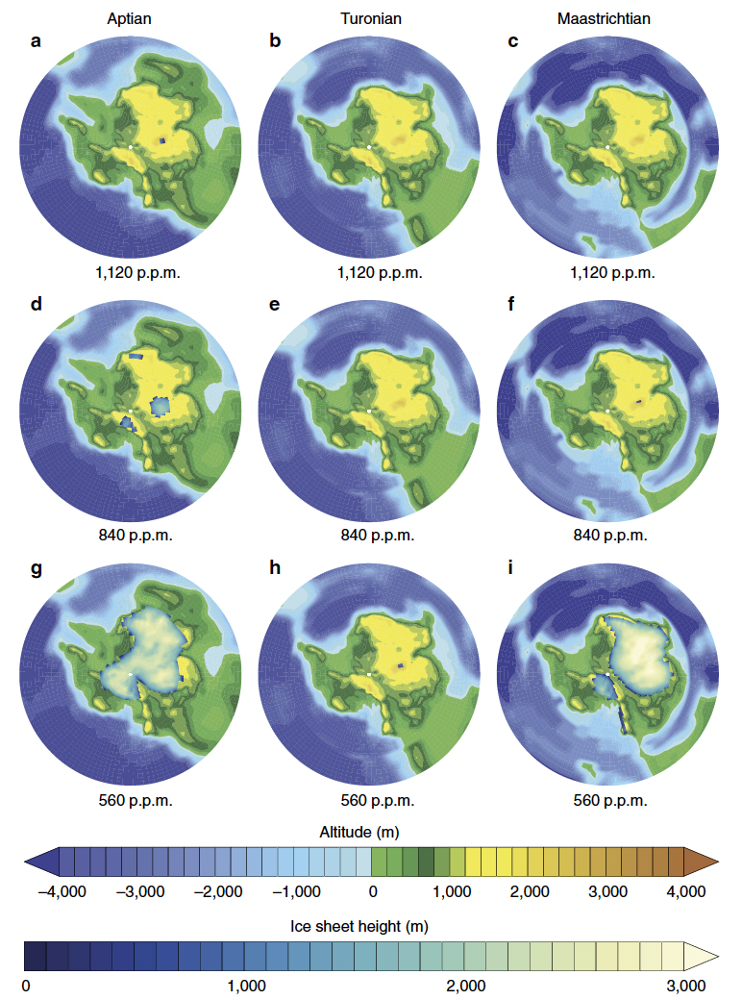

## Review from last time: loops

```
for <item> in <collection>:
    <do stuff>


while <condition is True>:
    <do stuff>
```


## Review from last time: the `range()` function

```
for counter in range(10, 0, -1):
    print(counter)
print("BLASTOFF!!")
```

##  <span style="color: purple;"> Motivating Geoscience Problem: Glacier Mass Balance <span>

    
Satellite image of the Chamonix area in the French Alps, showing two main glaciers: the Argentiere glacier and the Mer de Glace. 
    
Note that a part of each glacier is white (snow-covered) and a lower part is grey-ish (snow is melted and rocks and sediments lay on the bare surface). Glaciers only form on land where annually more snow accumulates than melts. Over a period of many years, snow becomes deep enough to form glacier ice.

###  <span style="color: purple;"> Calculating the Annual Mass Balance </span>

Glaciologists often need to know the **annual mass balance** for a glacier.

**annual balance = depth accumulated in winter - depth melted ("ablated") in summer**

(in water-depth equivalent)

But the annual balance varies a lot with altitude.

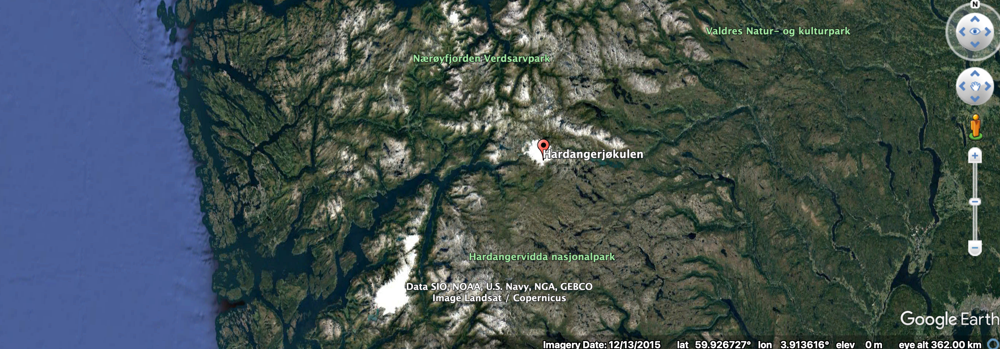

In [ ]:

# the following (clunky!) code reads in data from a file
with open("hardangerjokulen2006-2007.csv", "r") as f:
    f.readline() # header line 1
    f.readline() # header line 2
    altmin = []
    altmax = []
    area = []
    winter_balance = []
    summer_balance = []
    for _ in range(17):
        line = f.readline()
        items = line.split(",")
        altmin.append(int(items[0]))
        altmax.append(int(items[1]))
        area.append(float(items[2]))
        winter_balance.append(float(items[3]))
        summer_balance.append(float(items[4]))
f.close()

# Display a crude table showing the data
print("Altitude       Area     Winter  Summer")
print("(m)            (km2)    (mwe)   (mwe)")
for i in range(len(altmin)):
    print(
        str(altmin[i]) + "-" + str(altmax[i])
        + "\t" + str(area[i])
        + "\t" + str(winter_balance[i])
        + "\t" + str(summer_balance[i])
    )

In [ ]:
# print out lists `altmin`, `altmax`, `area`, `winter_balance`, and `summer_balance` to verify
print(winter_balance)
print(summer_balance)

### Goal: add up the summer and winter balance to get the annual net

```
annual_balance = winter_balance + summer_balance
print(annual_balance)
print("Number of items:", len(annual_balance))
```

In [ ]:
# Try running the above code. Does it add up each pair of values in the two lists?
winter_balance + summer_balance

### List concatenation

When the addition operator `+` is applied to two lists, Python **concatenates** the lists!


Before you run the line below, see if you can guess what it will produce:
```
[1, 2] + [3, 4]
```

In [ ]:
[1, 2] + [3, 4]

### <span style="color: green;">IN-CLASS PRACTICE: Warm-up exercise</span>


1. Make a new empty list called `annual_balance`

2. Write a loop that iterates over the items in `winter_balance` and `summer_balance` (so, 17 times)

3. At each iteration, add the winter and summer balance together and use `annual_balance.append()` to add the new value to your list

4. Print out `annual_balance` to verify

In [ ]:
# make a new empty list 
pass # replace pass with code that makes an empty list

# loop over the values in winter_balance / summer_balance
for i in range(len(winter_balance)):
    pass # replace pass with your code

# print out the new `annual_balance` list

In [ ]:
# if you have extra time, try the following alternative approach:

# make new empty list
pass # replace pass with code that makes an empty list

for winter, summer in zip(winter_balance, summer_balance):
    pass # replace pass with code that adds them

# what do you think `zip` does?

# try: list(zip(winter_balance, summer_balance))
# what does it produce?

### What else might you want to do with these data?

- Multiply each value by `area` to get the **volume** of water
- Add up all the results to get the total volume for the whole glacier
- Add up just the negative values, to get the total summer melt volume
- Plot the data by altitude

### Wouldn't it be nice if we could do operations on *all the values at once*?

## What is NumPy?

- NumPy [(https://numpy.org/)](https://numpy.org/) is a Python package for scientific computing

- Provides an **array** data type for multi-dimensional arrays

- Provides a host of other functions and capabilities

- Free and open source

## Installing and importing NumPy

NumPy is already installed on our class JupyterHub. If you are using your own computer rather than the hub, you will need to install it. An easy way to do this is to install the [Anaconda Distribution](https://www.anaconda.com/data-science-platform).

Here's a common way to import and test NumPy:

```
import numpy as np

print("Pi is", np.pi)
```

In [ ]:
import numpy as np

print("Pi is", np.pi)

## Creating an array

There are many ways to create a new array variable. Here's one:

```
myarr = np.zeros(4) # create a new array with 4 elements, all equal to zero
print(myarr)
print(type(myarr))
```

In [ ]:
myarr = np.zeros(4)
print(myarr)
print(type(myarr))

The type `numpy.ndarray` tells us that the type `ndarray` is defined in the `numpy` package, rather than being a built-in part of the Python language. The `nd` stands for "N-dimensional".

## About arrays

Numpy `ndarrays` are similar to Python `lists`, but with some important differences:

- A single list can contain object of different types; in an ndarray, all objects have the same type (default `float` but you can override this)

- An `ndarray` can have multiple dimensions (the "n" in "nd"), which is a bit similar to nested lists but with more flexibility

- When a mathematical operation is performed on one or more ndarrays, it is (usually) applied to *all* elements of the array at once


## Some other ways to create new arrays

- The `array()` function turns a list into an array. Ex: `myarr = np.array([1, 3, 2])`

- Functions like `zeros(), ones(),` and `empty()` create an array of given size. Ex: `myarr = np.ones(5)`

- The `arange()` ("array-based range") acts like `range()` but generates an array. Ex: `myarr = np.arange(1, 10, 2)`

- The `linspace()` and `logspace()` functions also create arrays with sequences of values. Ex: `myarr = linspace(0, 100, 25) # create a sequence of 25 numbers from 0 to 100`

- Many operations on arrays will produce a new array as output



In [ ]:
myarr = np.array([1, 3,2])

## Operations on arrays: array and float/int

If you perform an arithmetic operation between an `ndarray` and a `float` or `int`, the operation is performed on each item in the array, and a new array is produced. Example:

```
n = 2
a = np.array([1, 2, 3, 4, 5])
b = a ** n
print(b)
print(type(b))
```

What happens if you use `+`, `-`, `*`, or `/` instead?

In [ ]:
n = 2
a = np.array([1,2, 3, 4, 5])
b = a ** n
print(b)
print(type(b))

## Operations on arrays: two arrays

If you perform an arithmetic operation between two `ndarrays` **of the same size**, the operation is done on each pair of corresponding values, and a new array is produced. Example:

```
a1 = np.array([1, 2, 3, 4])
a2 = np.array([5, 6, 7, 8])
a3 = a1 + a2
print(a3)
print(type(a3))
```

In [ ]:
a1 = np.array([1, 2, 3, 4])
a2 = np.array([5, 6, 7, 8])
a3 = a1 + a2
print(a3)
print(type(a3))

In [ ]:
# But if the arrays are of different sizes, you'll get an error: try it out!
thing1 = np.array([1, 2, 3])
thing2 = np.array([4, 5])
#thing1 + thing2 # uncomment this line to see what happens

### Broadcasting

When an operation is performed on two arrays together, NumPy is said to "broadcast" their values together. There needs to be a one-to-one match in the size and shape of the two arrays.

## <span style="color: green;">IN-CLASS PRACTICE</span>

Try out some different ways to create and print out an array.

(Remember, `help()` is your friend...)

In [ ]:
# Make an array using `array()`
a = np.array([3.14, 2.75, -14])
print(a)

# Make an array using `zeros()` or `ones()`
b = np.ones(7)
print(b)

# Make an array with a sequence of numbers 0, 10, 20, ... 100 using `arange()`
c = np.arange(0, 110, 10)
print(c)

# Make an array with 11 numbers between 0 and 1 using `linspace()`
d = np.linspace(0, 1, 11)
print(d)

# Multiply the last two of these arrays by one another
f = c * d
print(f)

## <span style="color: green;">IN-CLASS PRACTICE: Back to the glacier example</span>

Let's calculate the net annual balance using arrays. Try the following:

In [ ]:
# Use the `array` function to make array versions of the lists `winter_balance` and 
# `summer_balance` (re-copied here for your convenience)
winter_balance = [
 2.7,
 3.45,
 3.6,
 3.5,
 3.2,
 2.7,
 2.35,
 1.95,
 1.73,
 1.56,
 1.39,
 1.22,
 1.05,
 0.8,
 0.55,
 0.3,
 -0.05]
summer_balance = [
 -1.45,
 -1.5,
 -1.6,
 -1.75,
 -1.9,
 -2.1,
 -2.3,
 -2.5,
 -2.7,
 -2.95,
 -3.2,
 -3.45,
 -3.7,
 -3.95,
 -4.25,
 -4.55,
 -4.9]

winter_array = np.array(winter_balance)
summer_array = np.array(summer_balance)

# add the two to get a new array called "annual_net" and print its value
annual_net = winter_array + summer_array
print(annual_net)

# multiply `annual_net` by `area` (the glacier surface area in each elevation range)
# to get the volume of water gained or lost by the glacier in each elevation range
annual_volume = annual_net * area * 1e6
print(annual_volume)
print(type(area))

# use the function `np.sum()` on your result to find the total net volume change for the
# glacier as a whole
total_vol = np.sum(annual_volume)
print(total_vol)

In [ ]:
# OPTIONAL: if you have extra time, try averaging `altmin` and `altmax` to get the 
# altitude mid-point for each point



# OPTIONAL: and if you get this far, uncomment and edit the lines below to make a plot:
#import matplotlib.pyplot as plt # we'll learn about this next week!
#plt.plot(PUT-YOUR-ELEVATION-ARRAY-NAME-HERE, PUT-YOUR-VOLUME-ARRAY-NAME-HERE)

## Array indexing

For 1D arrays, you access their elements the same way you access elements of a list.

Before your run each of these examples, guess what value will be displayed.

```
a = np.arange(10) ** 2
print(a[3]) # element 3
print(a[:3]) # elements 0, 1, 2 (up to but not including 3)
print(a[3:]) # elements from 3 to the end of the array
print(a[3:6]) # elements 3, 4, 5 (NOT 6)
print(a[-1]) # last element in the array
print(a[-2]) # next-to-last element in the array
```


In [ ]:
a = np.arange(10) ** 2
print(a[3])

## Mathematical functions on arrays

NumPy has lots of built-in math functions, including trig functions (`sin`, `cos`, etc.), conversion between degrees and radians, logarithms, exponentiation, and a lot more.

Example: let's make a sine wave to represent variations in the length of day over the course of a year.



## <span style="color: green;">IN-CLASS PRACTICE: Length of day</span>


From [this wonderful site](https://www.timeanddate.com/sun/usa/boulder) we learn that Boulder's days are about 15 hours long at the summer solstice and 9 hours long at the winter solstice. That's a range of 6 hours and a period of one year (by definition!). Our formula for the length of day ("LOD", here represented in math by the symbol $L$) is therefore:

$$L = L_\text{mean} + R \sin(2\pi t / P)$$

where $L_\text{mean} = 12$ hours is the mean day length, $R = 6$ hours is the annual range, $t$ is the time in days since the vernal equinox ($\sim$March 21), and $P$ is the period in days (= 365, or really 365.25 if you want to want to be more accurate and factor in leap years).



In [ ]:
# make an array to represent days of the year


# define variables for `period` (= 365 days), `mean_lod` (= 12 hours), 
# and `lod_range` (= 6 hours) 


# use `np.sin()` to calculate the length of day for each day of the year


# make a plot
import matplotlib.pyplot as plt

#plt.plot(NAME_OF_TIME_VARIABLE_HERE, NAME_OF_LOD_VARIABLE_HERE)
#plt.xlabel('Time from vernal equinox (days)')
#plt.ylabel('Length of day (hours)')

## Review

- Import numpy
- Create numpy array variables using `array`, `zeros`, `ones`, `arange`, and `linspace`
- Use slicing to index values in an array
- Perform operations on arrays
- Use numpy mathematical functions such as `exp`, `sin`, etc.

## The rest of this notebook is optional extra material that we'll cover only if time allows...

## Boolean indexing

Suppose I want to find out the total volume of water that melted from Hardangerjokul in 2006-7. We could just add up all the summer balance values, right? Except there was also some melt in the *winter* at lower elevation.

How would you identify those data points in the winter balance that were negative, meaning there was loss, so we can include that in our total?

One solution is *boolean indexing*

Recall how boolean operations work:

```
a = -2
a < 0  # returns True
```

If we do this on an array, we get a **boolean array** back:
```
a = np.array([1, -3, 2, -4])
is_negative = a < 0.0
print(is_negative)
type(is_negative)
type(is_negative[0])
```

We can use a boolean array as the index for another array, and the result will return a new array with just those values that are `True`.

Example:
```
a = np.array([1, -3, 2, -4])
print(a[a < 0])
```

In [ ]:
# let's play with this

### Try it out

How could we use boolean indexing to get an array of values from `winter_balance` that contains *only* those values (just 1 of them in this case) that are negative?

## Multi-dimensional arrays

In earth science, it is not uncommon to work with 2D or even 3D arrays of data. Creating multi-dimensional arrays starts with the notion of using a `tuple` to specify the desired array dimensions. Example:

```
a = np.zeros((3, 4)) # create a 3-row by 4-column array, all filled with zeros
print(a)
```

Indexing uses commas to distinguish between different dimensions. Example:

```
a[1, 3] = 15.0 # row 1, column 3
print(a)
```